# Image Preprocessing Evaluation
**Note:** This notebook was created in october 2023 and may not be up-to-date with the latest changes in the repository. Please be aware that some parts might not work as expected with the current version of the project.

## Outline
This notebook is used for PCB images preprocessing evaluation. The following preprocessing steps are represented here:  
- Step 1: Histogram Equalization  
- Step 2: Noise Reduction  
- Step 3: Convert to Grayscale
- Step 4: Resizing
- Step 5: Perspective Correction (in work)  
- Step 6: Tresholding
- Step 7: Morphological operations: Opening or Closing (No promising results)
- Step 8: Normalization
- Step 9: Standardization (Not a good idea after Tresholding and Normalization, I think it can be deleted)
- Additional Step: Edge Detection (The results are not promising at all, probably also not suitable as layout details is in risk to get lost)

Additional annotations:
- Make use of color space other than RGB, like HSV, for histogram equalization and noise reduction (I doubt this brings significant improvements).
- Background Subtraction (I believe it is not suitable, I assume in the PCB Images is no background to subtract)
- Correcting Lens Distortion (As no camera/Lens information corresponding to the images will be availabe, I would assume it would become to complex to implement)
- Feature extraction (I would delegate this task to the deep learning model)
- Data Augmentation (Same as Feature Extraction, delegation to the deep learning model)

Open questions:
- What else could be done?
- What else do i need to know regarding preprocessing steps?
- What is the common way to find the best suiting preprocessing steps in Machine Learning Tasks?


## Imports

In [1]:
import tensorflow as tf
import numpy as np
import cv2
import importlib

import source.load_raw_data.kaggle_dataset as kaggle_dataset
import source.utils.pcb_visualization as pcb_visualization

c:\MEIN_PLATZ\Git\pcb-defect-detection\venv\Lib\site-packages\tensorflow\python\framework\dtypes.py:35: DeprecationWarning: ml_dtypes.float8_e4m3b11 is deprecated. Use ml_dtypes.float8_e4m3b11fnuz
  from tensorflow.tsl.python.lib.core import pywrap_ml_dtypes


In [2]:
importlib.reload(pcb_visualization)
pcb_visualizer = pcb_visualization.PCBVisualizerforTF()

### Initialization

In [3]:
pcb_visualizer = pcb_visualization.PCBVisualizerforTF()

### Load Data

In [4]:
image_dataset = kaggle_dataset.get_tf_dataset()

`image_dataset`: A TensorFlow dataset containing tuples of images and their corresponding category codes, ready for training machine learning models for PCB defect detection.


**Steps Involved**:

1. Data Preparation:
   - Reads a CSV file from a Kaggle dataset ([`pcb_defects_kaggle`](../../load_raw_data/kaggle_dataset.py)).
   - Collects unique image paths and their corresponding defect category codes.

2. Shuffling:
   - Randomizes the order of images and categories.

3. TensorFlow Dataset Generation:
   - Converts image paths and categories into a tensor and forms a TensorFlow dataset.
   - Prefetches the dataset for efficient data loading.

### Raw Images

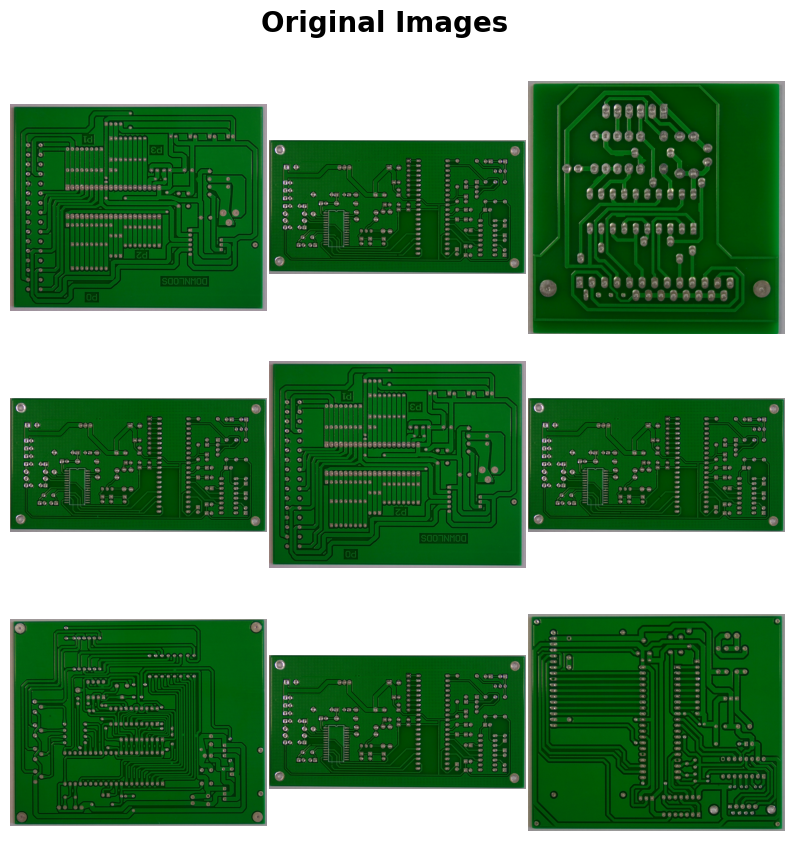

In [5]:
pcb_visualizer.plot_images(image_dataset, 'Original Images')

## Step 1.a: Global Histogram Equalization
### Implementation

In [7]:
def global_histogram_equalization(tf_image, tf_target):

    cv_img = tf_image.numpy().astype('uint8')

    # Apply histogram equalization to each of the RGB channels independently
    channels = cv2.split(cv_img)
    eq_channels = [cv2.equalizeHist(ch) for ch in channels]  
    cv2_eq_image = cv2.merge(eq_channels)
    
    tf_eq_image = tf.convert_to_tensor(cv2_eq_image, dtype=tf.uint8) 
    
    return (tf_eq_image, tf_target)

image_dataset_equalized_glo = image_dataset.map(
    lambda img, tgt: tf.py_function(func=global_histogram_equalization, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)

### Processed Images

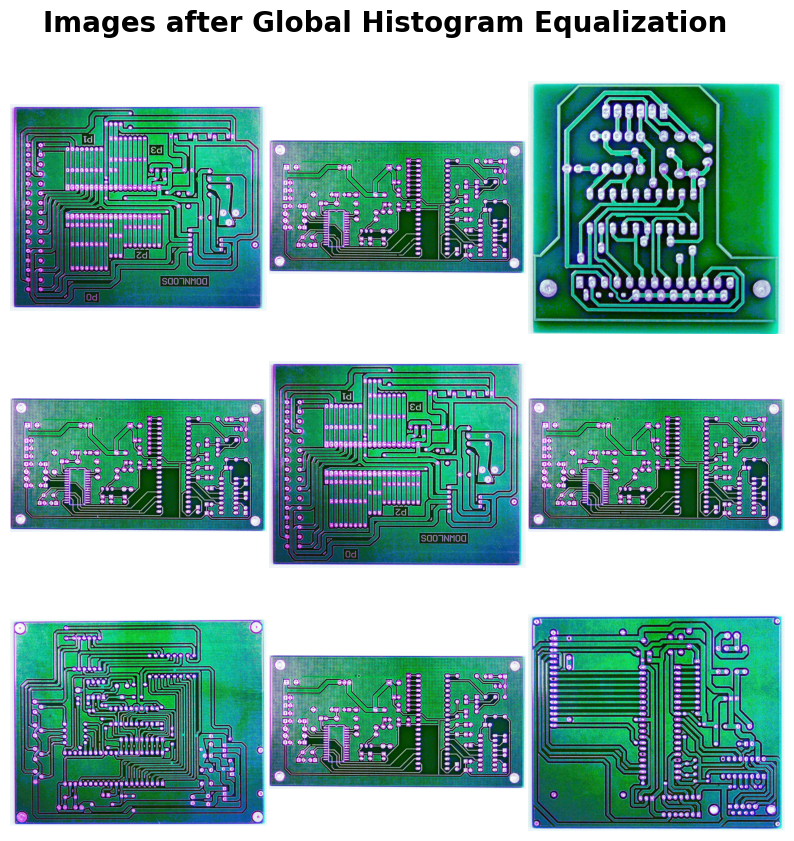

In [8]:

pcb_visualizer.plot_images(image_dataset_equalized_glo, 'Images after Global Histogram Equalization')

### Analysis Graphs

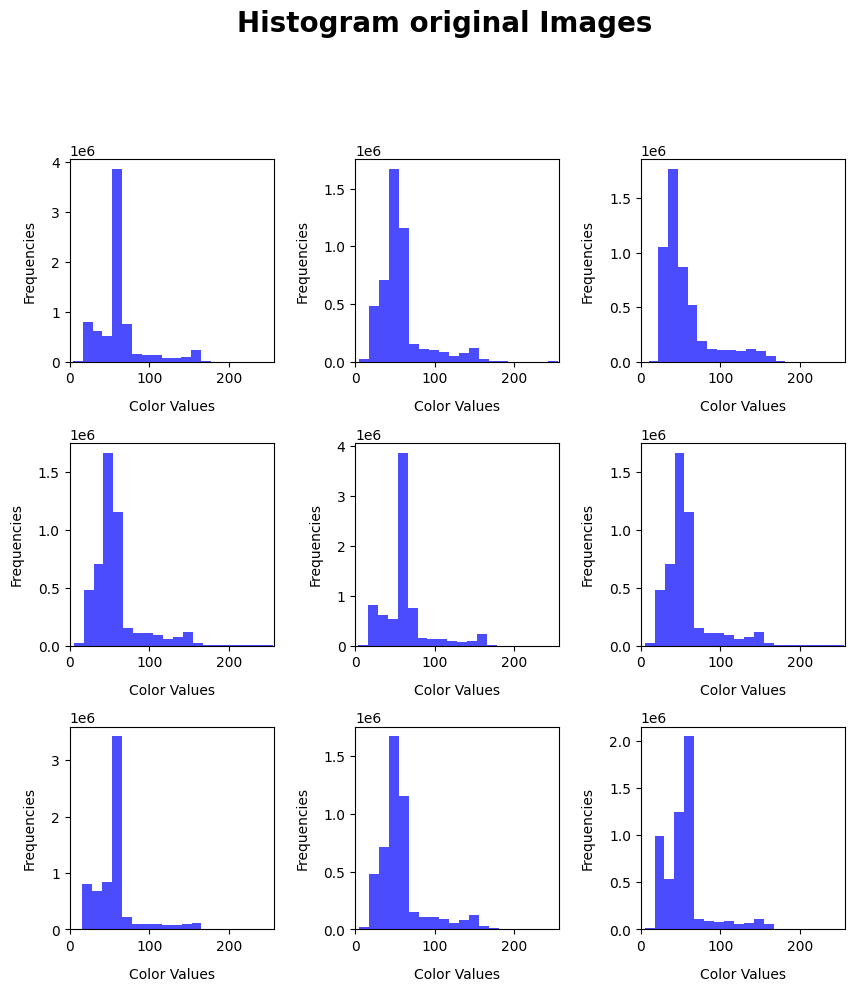

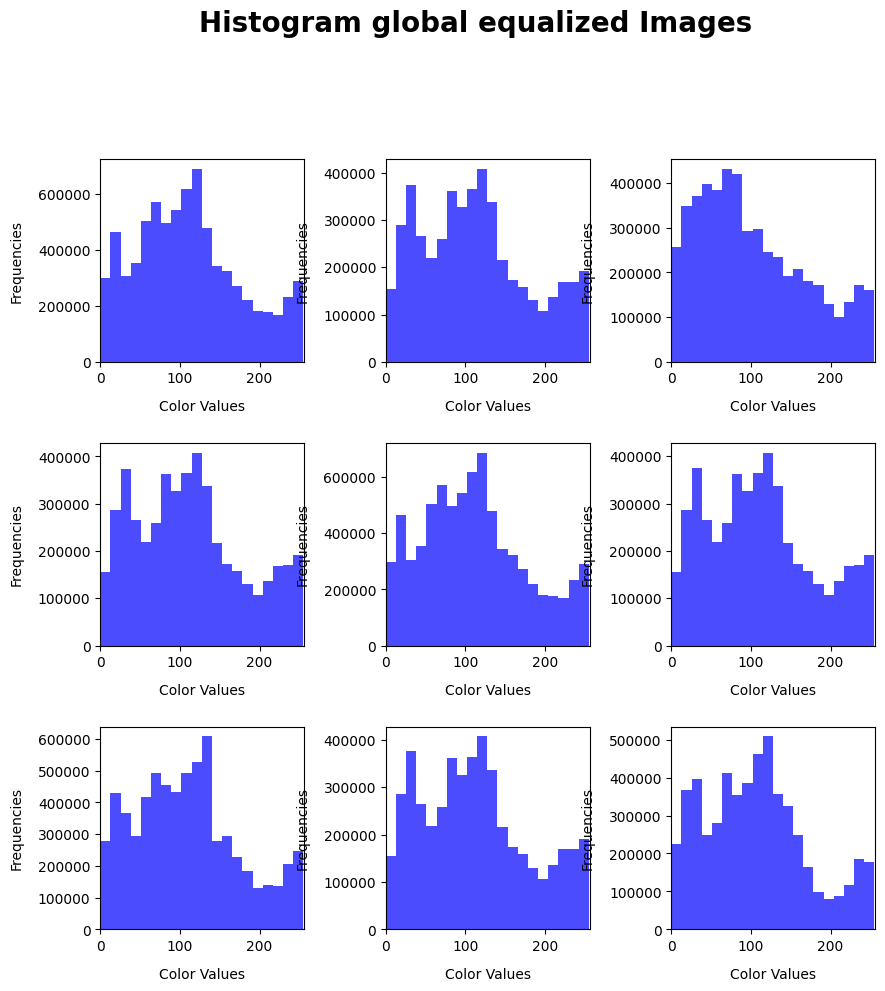

In [9]:
pcb_visualizer.plot_histograms(image_dataset, 'Histogram original Images')
pcb_visualizer.plot_histograms(image_dataset_equalized_glo, 'Histogram global equalized Images')

### Discussion
The images ploted above show a higher contrast comperad to the input images. The improved contrast can help in defect detection, as subtle differences are more visible. This can be also seen in the histogram of the images after histogram equalization: Two peaks are visible representing the solder mask and the copper material. However, it seems also to have introduced or amplified noise. Therefore in the next step the images will be subject to noise reduction. 

## Step 1.b: Adaptive Histogram Equalization
### Implementation

In [10]:
def adaptive_histogram_equalization(tf_image, tf_target):

    cv_img = tf_image.numpy().astype('uint8')

    channels = cv2.split(cv_img)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

    clahe_channels = [clahe.apply(ch) for ch in channels]

    cv2_clahe_image = cv2.merge(clahe_channels)
    
    tf_clahe_image = tf.convert_to_tensor(cv2_clahe_image, dtype=tf.uint8)
    
    return (tf_clahe_image, tf_target)


image_dataset_equalized_ad = image_dataset.map(
    lambda img, tgt: tf.py_function(func=adaptive_histogram_equalization, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)

### Processed Images

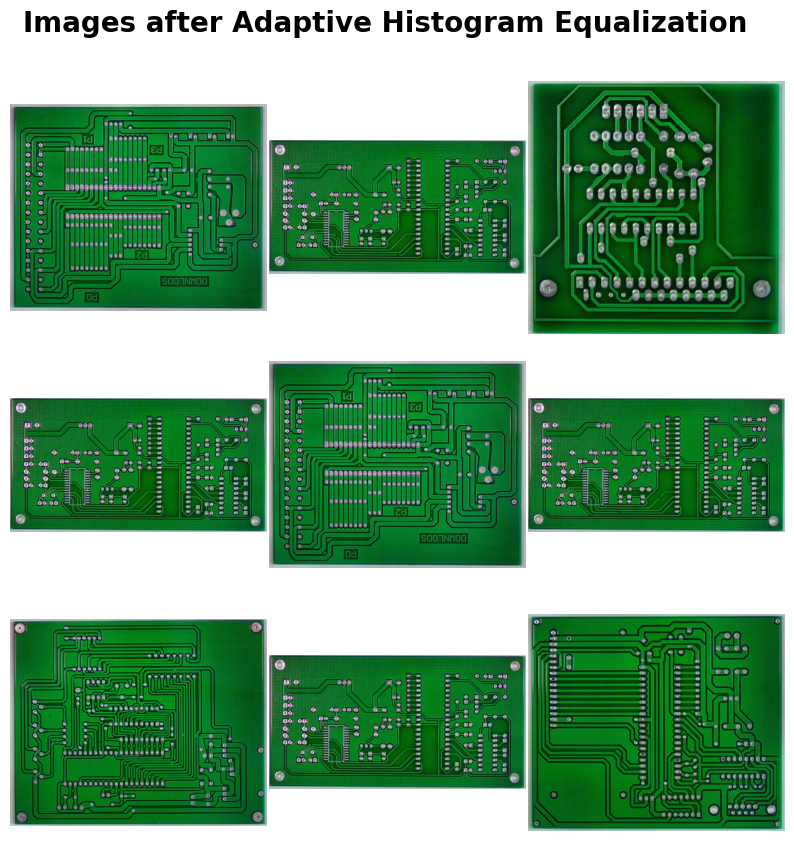

In [11]:
pcb_visualizer.plot_images(image_dataset_equalized_ad, 'Images after Adaptive Histogram Equalization')

### Analysis Graphs

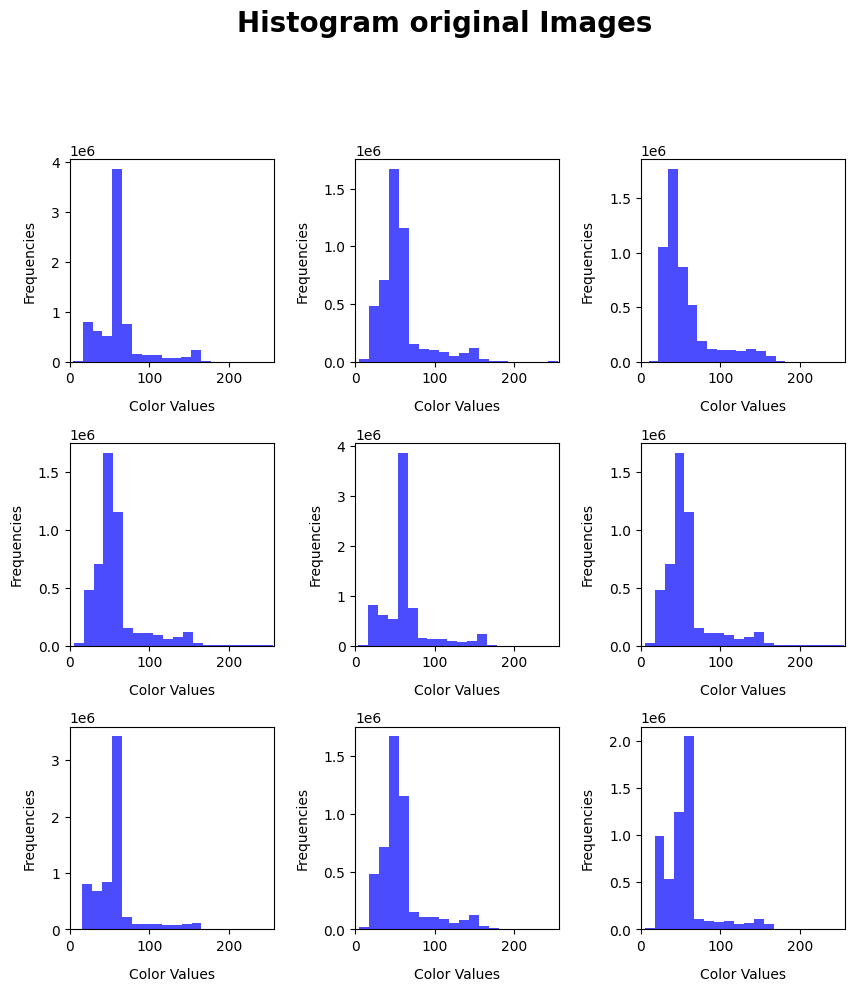

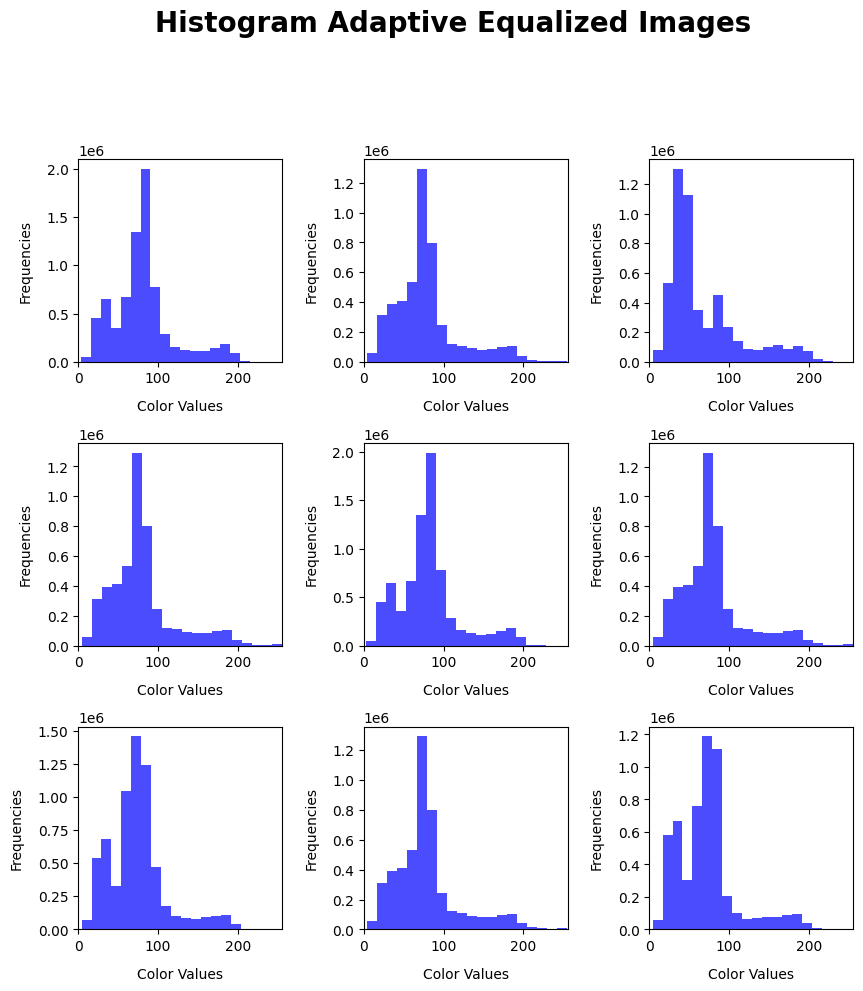

In [12]:
pcb_visualizer.plot_histograms(image_dataset, 'Histogram original Images')
pcb_visualizer.plot_histograms(image_dataset_equalized_ad, 'Histogram Adaptive Equalized Images')

### Discussion
Compared to the histograms of the global equalized images the peaks are higher and less spread out. The advantage is that Adaptive Histogram Equalization can enhance the regions of the PCB differently than there surrounding areas, this can make defects more distinguishable. Global Histogram Equalization makes the histogram too uniformly, what could hide certain details and potentially make it harder to detect defects.

## Step 2.a: Gaussian Blurring

### Implementation

In [13]:
def gaussian_blur(tf_img, tf_target, kernel_size=(5, 5), sigma=None):

    if not kernel_size[0] == kernel_size[1]:
        raise ValueError('Kernel size is not a square kernel.')

    cv_img = (tf_img.numpy()).astype('uint8')
    
    k = kernel_size[0] 
    sigma = 0.3*((k-1)*0.5 - 1) + 0.8 # Rule of thumb

    cv_blurred_image = cv2.GaussianBlur(cv_img, kernel_size, sigma)
    
    tf_blurred_image = tf.convert_to_tensor(cv_blurred_image, dtype=tf.uint8)
    
    return (tf_blurred_image, tf_target)

image_dataset_blurred = image_dataset_equalized_ad.map(lambda img, tgt: tf.py_function(func=gaussian_blur, inp=[img, tgt], Tout=(tf.uint8, tf.int8)))

### Processed Images

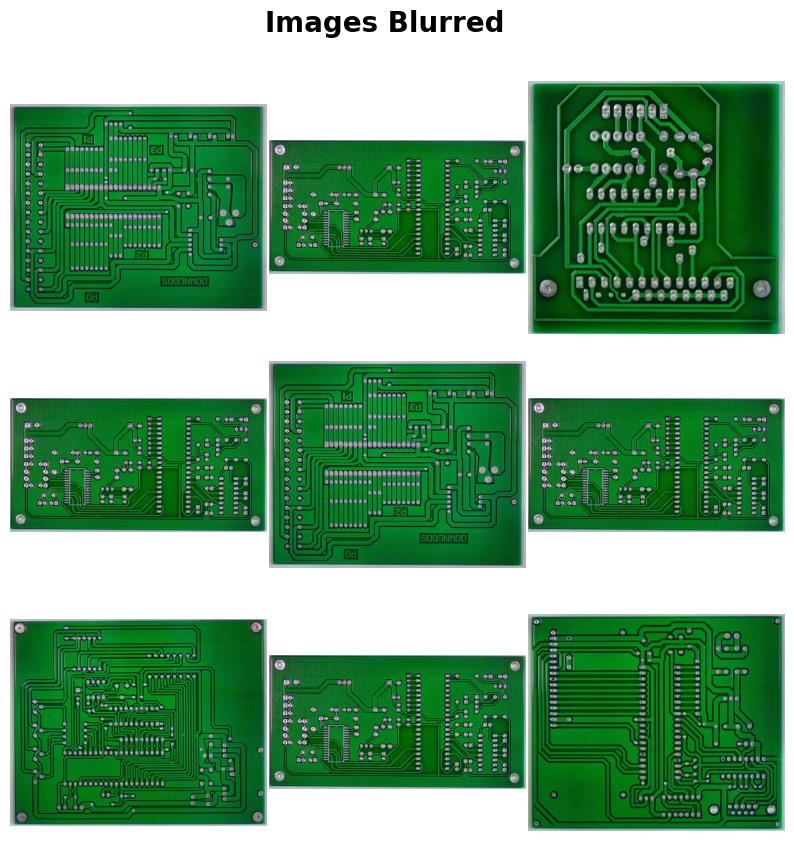

In [14]:
pcb_visualizer.plot_images(image_dataset_blurred, 'Images Blurred')

### Analysis Graphs

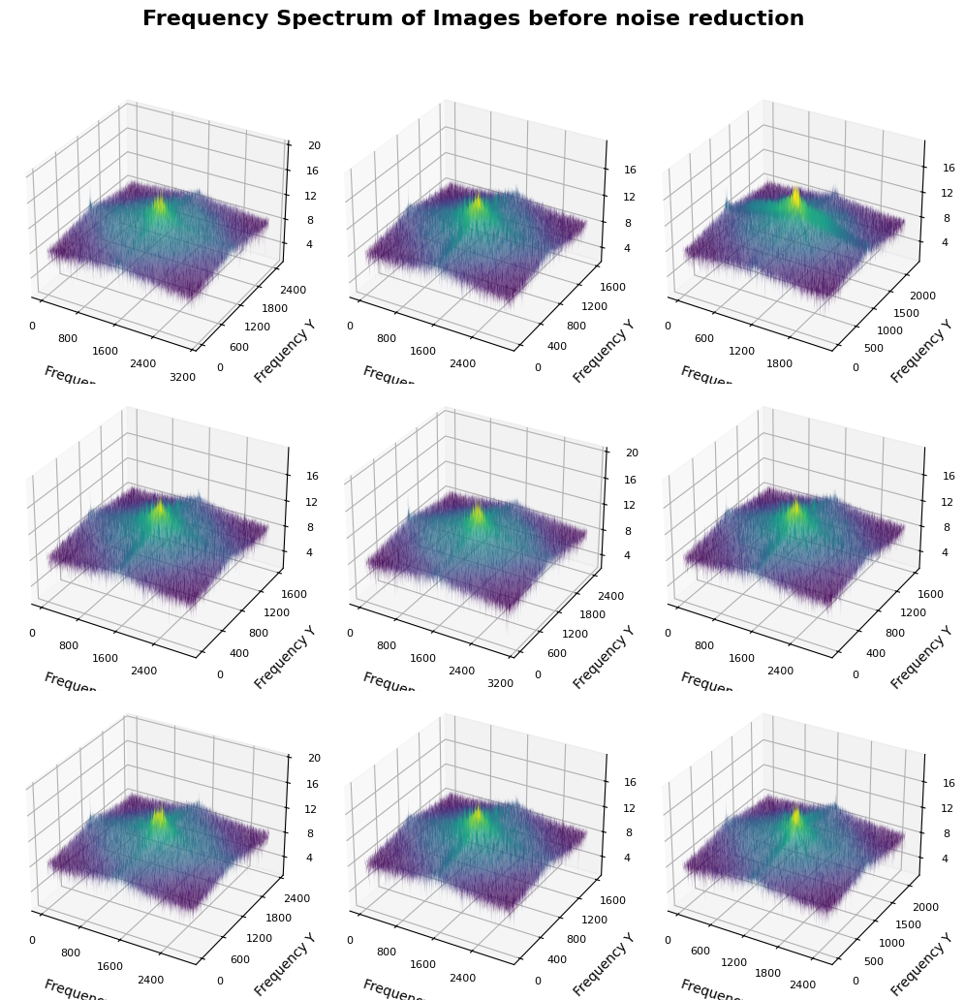

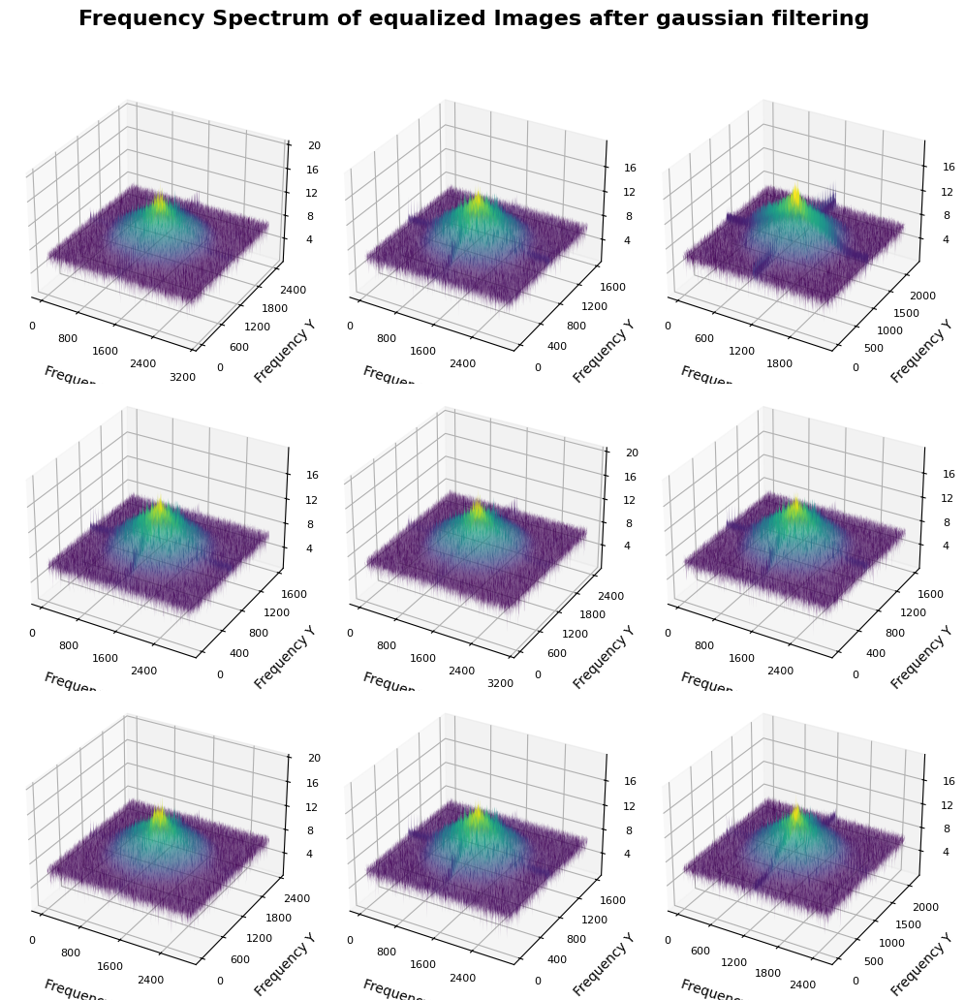

In [15]:
pcb_visualizer.plot_frequency_spectrum_3D(image_dataset_equalized_ad, 'Frequency Spectrum of Images before noise reduction')
pcb_visualizer.plot_frequency_spectrum_3D(image_dataset_blurred, 'Frequency Spectrum of equalized Images after gaussian filtering')

### Discussion
The processed images to be the same as before the noise reduction. However in the frequency spectrum differences became visible: The noise is reduced and flattened.

## Step 2.b: Median Filtering
### Implementation

In [16]:
def median_filter(tf_img, tf_target, kernel_size=5):
    cv_img = (tf_img.numpy()).astype('uint8')
    
    cv_filtered_image = cv2.medianBlur(cv_img, kernel_size)
    
    tf_filtered_image = tf.convert_to_tensor(cv_filtered_image, dtype=tf.uint8)
    
    return (tf_filtered_image, tf_target)

image_dataset_median_filtered = image_dataset_equalized_ad.map(lambda img, tgt: tf.py_function(func=median_filter, inp=[img, tgt], Tout=(tf.uint8, tf.int8)))

### Processed Images

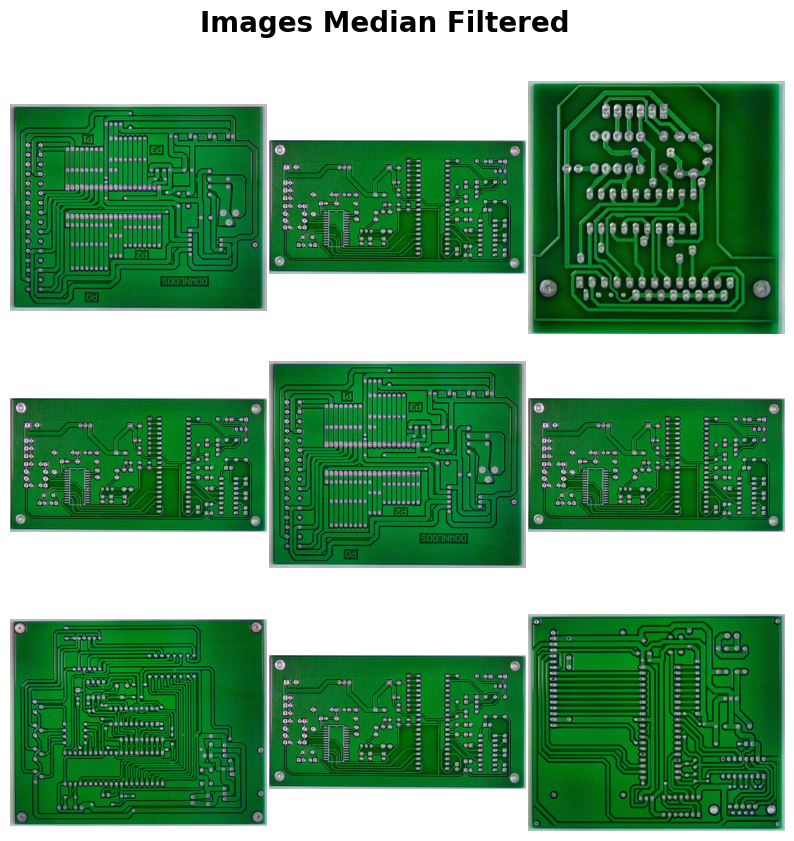

In [17]:
pcb_visualizer.plot_images(image_dataset_median_filtered, 'Images Median Filtered')

### Analysis Graphs

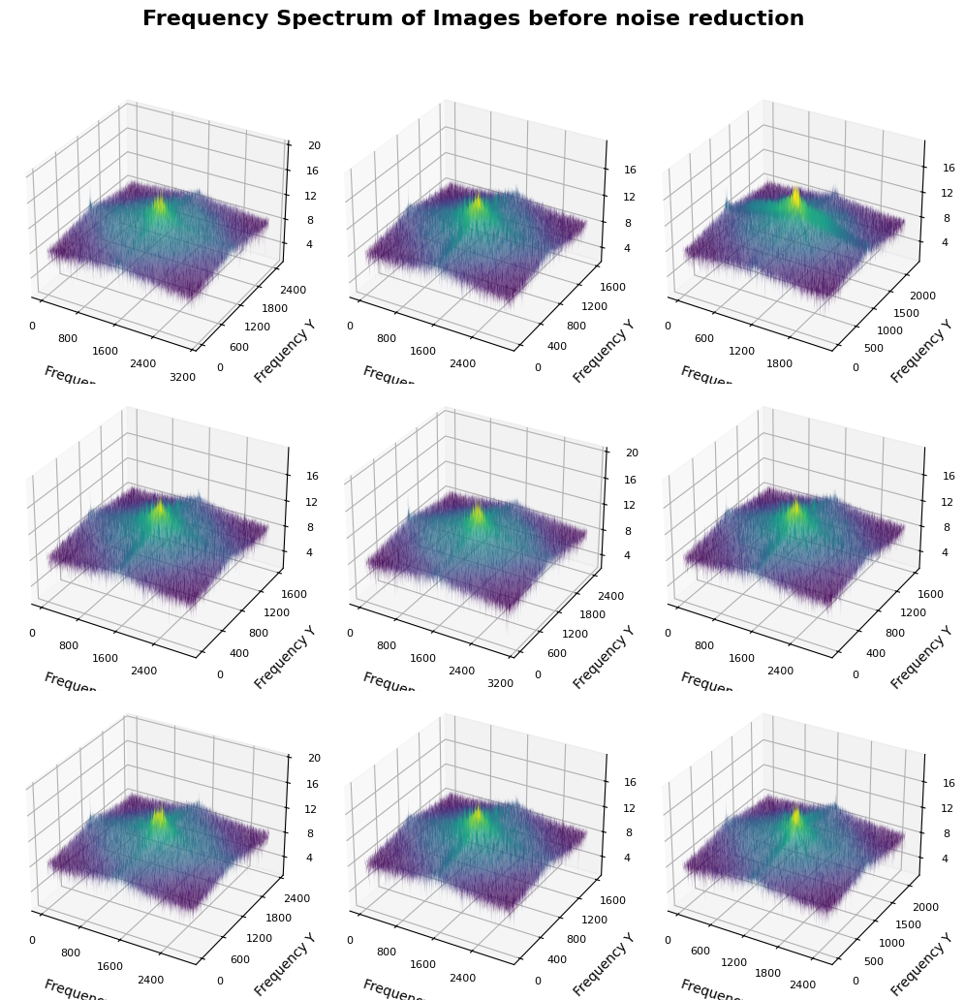

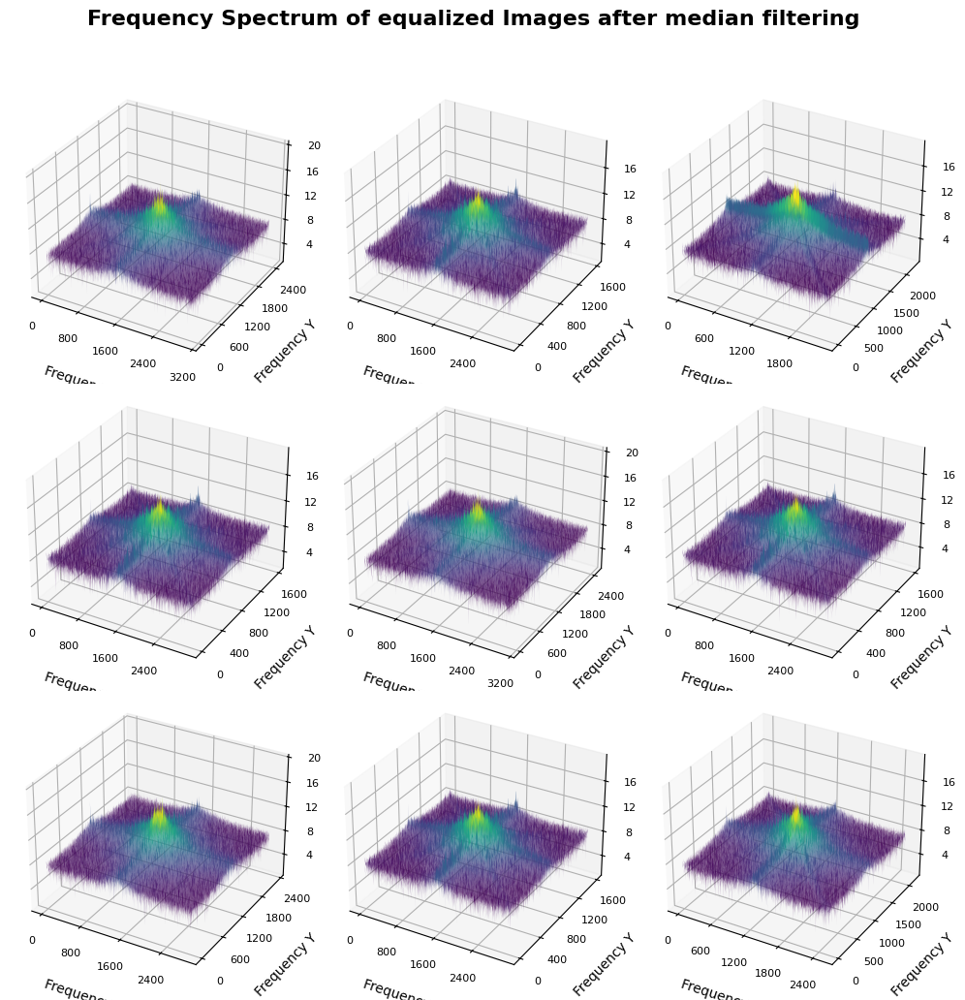

In [18]:
pcb_visualizer.plot_frequency_spectrum_3D(image_dataset_equalized_ad, 'Frequency Spectrum of Images before noise reduction')
pcb_visualizer.plot_frequency_spectrum_3D(image_dataset_median_filtered, 'Frequency Spectrum of equalized Images after median filtering')

### Discussion
The Performance of filtering noise is slightly reduced compared to the gaussian filter. The median filter is said to preserve better edges as the gaussian filter, this can be recognized through the spikes in the frequency spectrum. The gaussian filter showed more flattened results.

## Step 3: Convert to Grayscale

### Implementation

In [19]:
def to_grayscale(img, tgt):

    gray_image = tf.image.rgb_to_grayscale(img)
    
    return (gray_image, tgt)

grayscale_dataset = image_dataset.map(to_grayscale)

### Processed Images

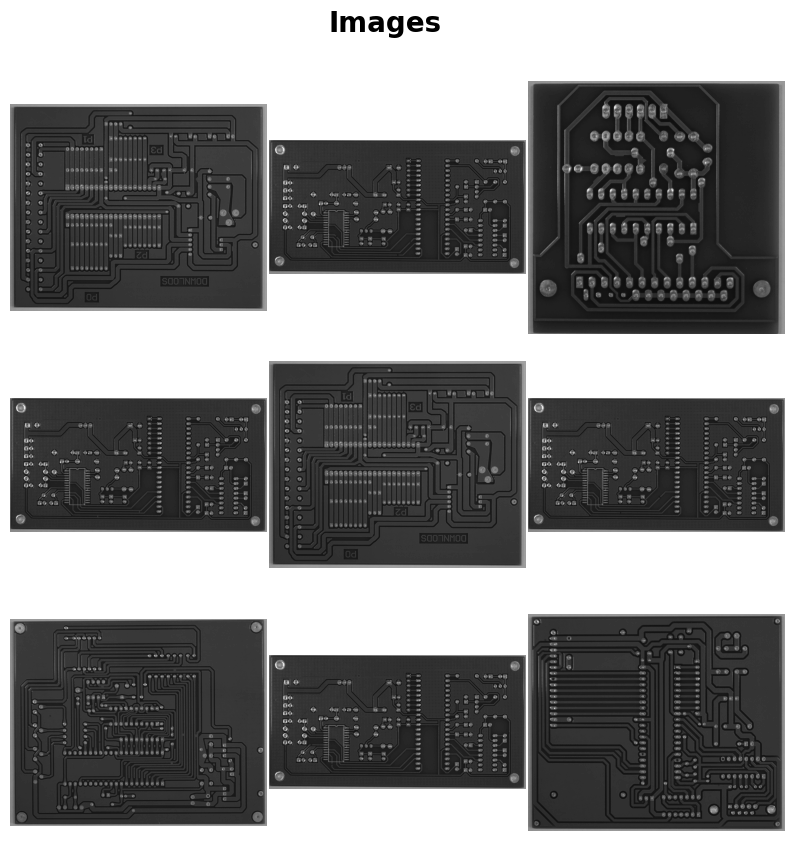

In [20]:
pcb_visualizer.plot_images(grayscale_dataset)

## Step 4: Perspective Correction
### Implementation

In [21]:
def perspective_correction(tf_image, tf_target):
    cv_img = tf_image.numpy().astype('uint8')

    corners = cv2.goodFeaturesToTrack(cv_img, 4, 0.05, 100) # Shi Tommasi algorithm.

    corners = np.intp(corners).reshape(-1, 2)
    
    sorted_corners = corners[np.argsort(corners[:, 1])]

    #If we do not get exactly 4 corners, return the original image
    if corners is None or len(corners) != 4:
        tf.print('Number of detected Corners: ', len(corners))
        return (tf_image, tf_target)
    
    tf.print('Top Left: ', sorted_corners[1], 'Top Right: ', sorted_corners[0], 'Bottom Left: ', sorted_corners[3], 'Bottom Right: ', sorted_corners[2])

    width_top = np.linalg.norm(sorted_corners[0] - sorted_corners[1])
    width_bottom = np.linalg.norm(sorted_corners[2] - sorted_corners[3])
    height_left = np.linalg.norm(sorted_corners[0] - sorted_corners[2])
    height_right = np.linalg.norm(sorted_corners[1] - sorted_corners[3])

    detected_width = (width_top + width_bottom) / 2
    detected_height = (height_left + height_right) / 2
    aspect_ratio = detected_width / detected_height

    # Determine dimensions for the desired rectangle
    if aspect_ratio > 1:
        desired_width = int(detected_width)
        desired_height = int(desired_width / aspect_ratio)
    else:
        desired_height = int(detected_height)
        desired_width = int(desired_height * aspect_ratio)

    desired_corners = np.array([
        [0, 0],
        [desired_width-1, 0],
        [0, desired_height-1],
        [desired_width-1, desired_height-1]
    ], dtype='float32')
    
    M = cv2.getPerspectiveTransform(np.float32(sorted_corners), desired_corners)
    warped_image = cv2.warpPerspective(cv_img, M, (desired_width, desired_height))
    warped_image = tf.reshape(warped_image, [cv_img.shape[0], cv_img.shape[1], 1])
    
    return (tf.convert_to_tensor(warped_image, dtype=tf.uint8), tf_target)

# Using tf.py_function with the function
perspective_corrected_dataset = grayscale_dataset.take(9).map(
    lambda img, tgt: tf.py_function(func=perspective_correction, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)

# Force exectution of the computation graph of the dataset
for image, label in perspective_corrected_dataset:
    pass


UnknownError: {{function_node __wrapped__IteratorGetNext_output_types_2_device_/job:localhost/replica:0/task:0/device:CPU:0}} InvalidArgumentError: {{function_node __wrapped__Reshape_device_/job:localhost/replica:0/task:0/device:CPU:0}} Input to reshape is a tensor with 370762 values, but the requested shape has 7529984 [Op:Reshape]
Traceback (most recent call last):

  File "c:\MEIN_PLATZ\Git\pcb-defect-detection\venv\Lib\site-packages\tensorflow\python\ops\script_ops.py", line 268, in __call__
    return func(device, token, args)
           ^^^^^^^^^^^^^^^^^^^^^^^^^

  File "c:\MEIN_PLATZ\Git\pcb-defect-detection\venv\Lib\site-packages\tensorflow\python\ops\script_ops.py", line 146, in __call__
    outputs = self._call(device, args)
              ^^^^^^^^^^^^^^^^^^^^^^^^

  File "c:\MEIN_PLATZ\Git\pcb-defect-detection\venv\Lib\site-packages\tensorflow\python\ops\script_ops.py", line 153, in _call
    ret = self._func(*args)
          ^^^^^^^^^^^^^^^^^

  File "c:\MEIN_PLATZ\Git\pcb-defect-detection\venv\Lib\site-packages\tensorflow\python\autograph\impl\api.py", line 643, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "C:\Users\43664\AppData\Local\Temp\ipykernel_17752\665717103.py", line 43, in perspective_correction
    warped_image = tf.reshape(warped_image, [cv_img.shape[0], cv_img.shape[1], 1])
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "c:\MEIN_PLATZ\Git\pcb-defect-detection\venv\Lib\site-packages\tensorflow\python\util\traceback_utils.py", line 153, in error_handler
    raise e.with_traceback(filtered_tb) from None

  File "c:\MEIN_PLATZ\Git\pcb-defect-detection\venv\Lib\site-packages\tensorflow\python\eager\execute.py", line 66, in quick_execute
    except TypeError as e:

tensorflow.python.framework.errors_impl.InvalidArgumentError: {{function_node __wrapped__Reshape_device_/job:localhost/replica:0/task:0/device:CPU:0}} Input to reshape is a tensor with 370762 values, but the requested shape has 7529984 [Op:Reshape]


	 [[{{node EagerPyFunc}}]] [Op:IteratorGetNext] name: 

### Processed Images

In [ ]:
pcb_visualizer.plot_images(perspective_corrected_dataset)

### Discussion
Shi Tommasi Corner Algorithm:
In the Outputs and in the Images it is clear that the corners are not detected correctly. Significant improvement of the functionality is required to be suitable to be applied as a preprocessing step in this project. 
Harris Corner Algorithm:
To many corners are detected with the current configuration.

## Step 5: Resizing

### Get Shape Statistics

In [ ]:
widths = []
heights = []

for image in image_dataset:  
    shape = image[0].shape
    widths.append(shape[0])  
    heights.append(shape[1]) 

widths = np.array(widths)
heights = np.array(heights)

print("Mean Width:", widths.mean())
print("Mean Height:", heights.mean())
print("Std Dev Width:", widths.std())
print("Std Dev Height:", heights.std())
print("Min Width:", widths.min())
print("Min Height:", heights.min())
print("Max Width:", widths.max())
print("Max Height:", heights.max())


Mean Width: 2157.239756180156
Mean Height: 2736.1876058245853
Std Dev Width: 274.6939498536975
Std Dev Height: 265.22556582554705
Min Width: 1586
Min Height: 2240
Max Width: 2530
Max Height: 3056


The statitistics of the image shapes are useful to find the fixed shape to which the images will be resized.
The image will be resized to a square shape. Before resizing the images are brougth to a squared shape with padding.

### Implementation

In [ ]:
DESIRED_H_AND_W = 2000

def resize_image(*tf_data):
    image = tf_data[0]
    shape = tf.shape(image)
    height, width = shape[0], shape[1]

    # Get the median pixel value
    flattened_img = tf.reshape(image, [-1])
    sorted_img = tf.sort(flattened_img)
    median_pixel_value = sorted_img[tf.shape(sorted_img)[0] // 2]

    if height > width:
        pad_top = 0
        pad_bottom = 0
        pad_left = (height - width) // 2
        pad_right = height - width - pad_left
    else:
        pad_top = (width - height) // 2
        pad_bottom = width - height - pad_top
        pad_left = 0
        pad_right = 0

    tf_padded_img = tf.pad(image, [[pad_top, pad_bottom], [pad_left, pad_right], [0, 0]], constant_values=median_pixel_value)
    tf_resized_image = tf.image.resize(tf_padded_img, [DESIRED_H_AND_W, DESIRED_H_AND_W], method='nearest')

    return (tf_resized_image, tf_data[1]) 

image_dataset_resized = grayscale_dataset.map(resize_image)


### Processed Images

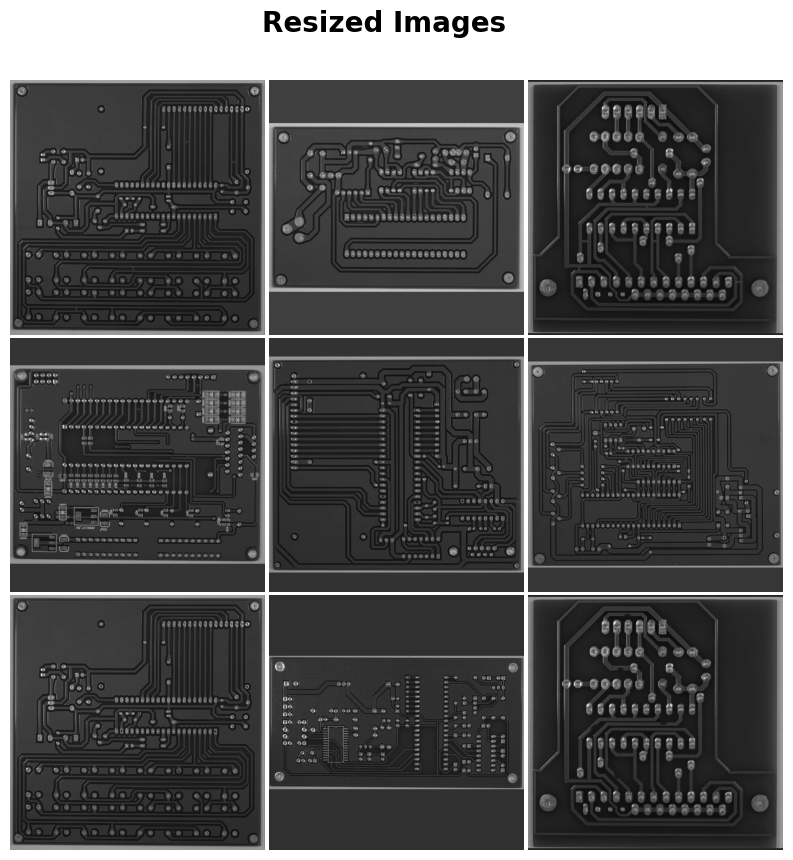

<Figure size 640x480 with 0 Axes>

In [ ]:
pcb_visualizer.plot_images(image_dataset_resized, 'Resized Images')

## Step 6.a: Otsu's Tresholding
### Implementation

In [ ]:
def otsu_thresholding(tf_image, tf_target):

    cv_img = tf_image.numpy().astype('uint8')
    
    _, otsu_img = cv2.threshold(cv_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    tf_otsu_img = tf.convert_to_tensor(otsu_img, dtype=tf.uint8)
    
    tf_otsu_img = tf.reshape(tf_otsu_img, [tf_otsu_img.shape[0], tf_otsu_img.shape[1], 1])
    
    return (tf_otsu_img, tf_target)

otsu_thresholded_dataset = image_dataset_resized.map(
    lambda img, tgt: tf.py_function(func=otsu_thresholding, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)


### Processed Images

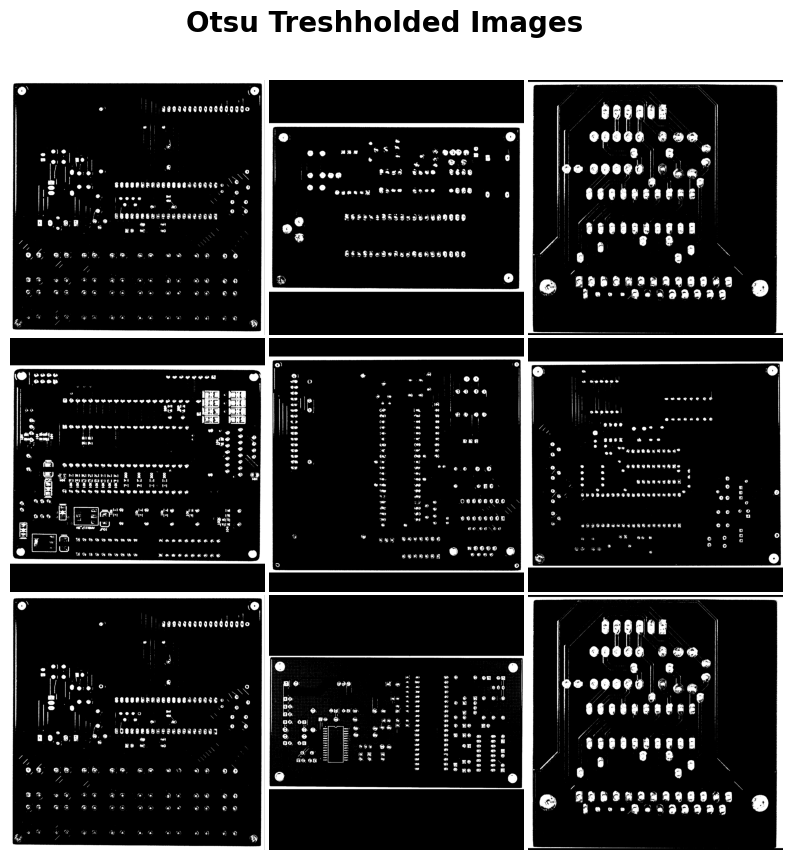

<Figure size 640x480 with 0 Axes>

In [ ]:
pcb_visualizer.plot_images(otsu_thresholded_dataset, 'Otsu Treshholded Images')

## Step 6.b: Adaptive Tresholding
### Implementation 

In [ ]:
def adaptive_thresholding(tf_image, tf_target):
    cv_img = tf_image.numpy().astype('uint8')

    adaptive_img = cv2.adaptiveThreshold(cv_img, 
                                         255, 
                                         cv2.ADAPTIVE_THRESH_MEAN_C, 
                                         cv2.THRESH_BINARY,
                                         15, # Block size.
                                         C=-2
                                        ) 
    tf_adaptive_img = tf.convert_to_tensor(adaptive_img, dtype=tf.uint8)
    
    tf_adaptive_img = tf.reshape(tf_adaptive_img, [tf_adaptive_img.shape[0], tf_adaptive_img.shape[1], 1])

    return (tf_adaptive_img, tf_target)

adaptive_thresholded_dataset = image_dataset_resized.map(
    lambda img, tgt: tf.py_function(func=adaptive_thresholding, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)


### Processed Images

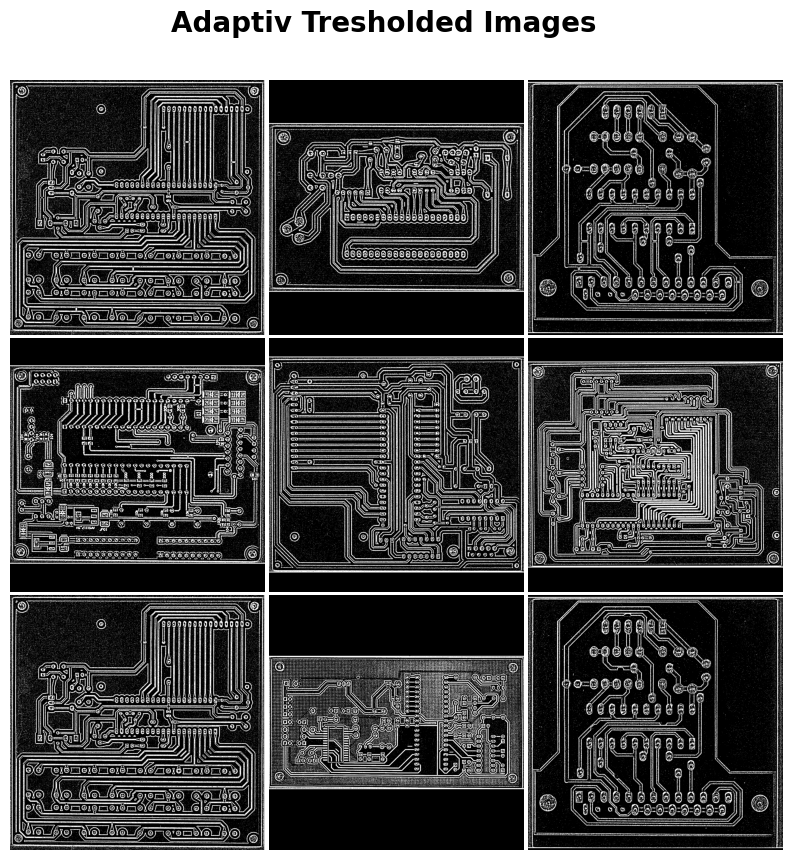

<Figure size 640x480 with 0 Axes>

In [ ]:
pcb_visualizer.plot_images(adaptive_thresholded_dataset, 'Adaptiv Tresholded Images')

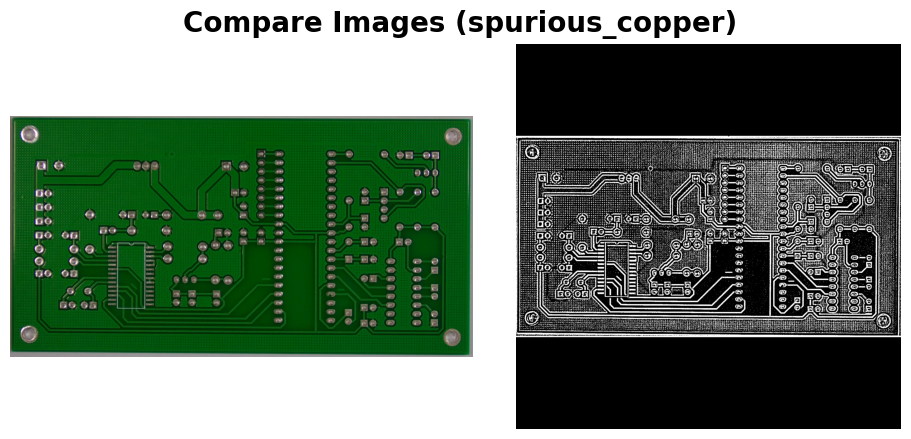

<Figure size 640x480 with 0 Axes>

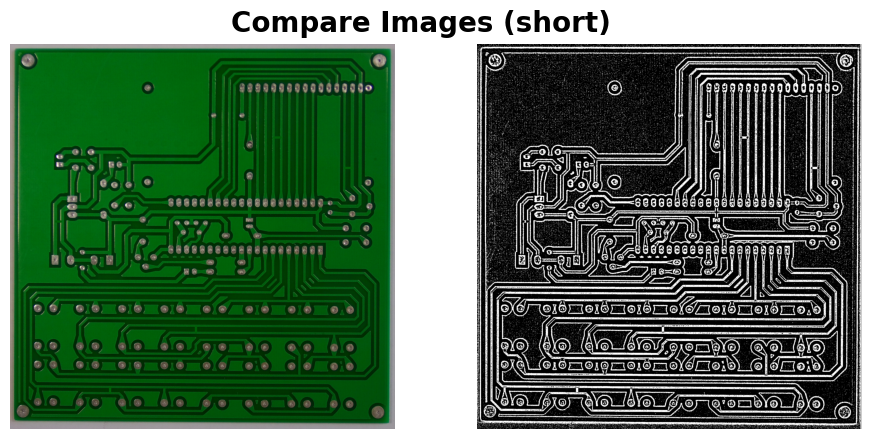

<Figure size 640x480 with 0 Axes>

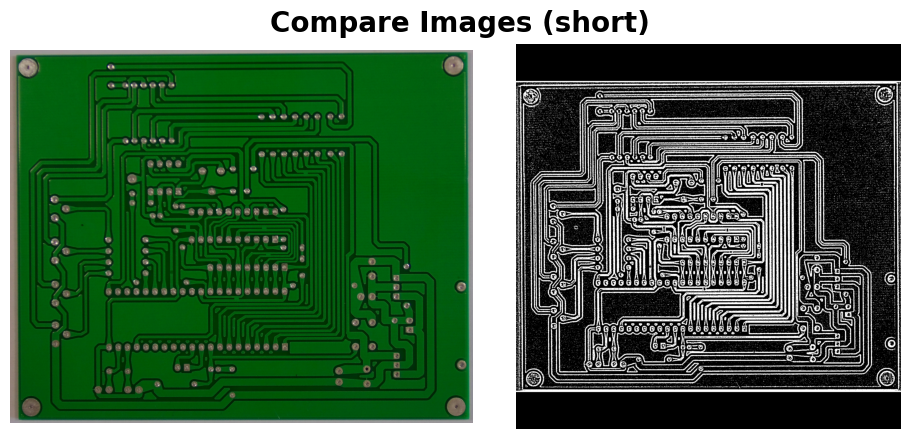

<Figure size 640x480 with 0 Axes>

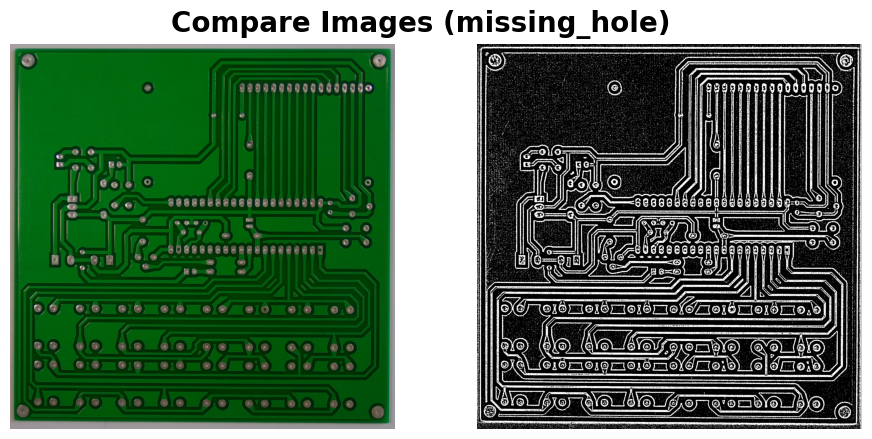

<Figure size 640x480 with 0 Axes>

In [ ]:
pcb_visualizer.plot_image_comparison(image_dataset, adaptive_thresholded_dataset, 7)
pcb_visualizer.plot_image_comparison(image_dataset, adaptive_thresholded_dataset, 0)
pcb_visualizer.plot_image_comparison(image_dataset, adaptive_thresholded_dataset, 5)
pcb_visualizer.plot_image_comparison(image_dataset, adaptive_thresholded_dataset, 6)

### Discussion
The Otsu Tresholded Images seem to infer some noise, also detail is lost. The adaptive Tresholded Images seem to be more detailed and to have less noise. The Adaptive Method seems superior, as it also allows to be optimized, changing the parameters: Block Size and Constant Value.

## Step 7.a: Morphological Opening Operation
### Implementation

In [ ]:

def morphological_opening(tf_image, tf_target):

    cv_img = tf_image.numpy().astype('uint8')

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    eroded_img = cv2.erode(cv_img, kernel, iterations=1)
    dilated_img = cv2.dilate(eroded_img, kernel, iterations=1)

    tf_dilated_img = tf.convert_to_tensor(dilated_img, dtype=tf.uint8)
    tf_dilated_img = tf.reshape(tf_dilated_img, [tf_dilated_img.shape[0], tf_dilated_img.shape[1], 1])

    return (tf_dilated_img, tf_target)

morphological_opening_dataset = adaptive_thresholded_dataset.map(
    lambda img, tgt: tf.py_function(func=morphological_opening, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)


### Processed Images

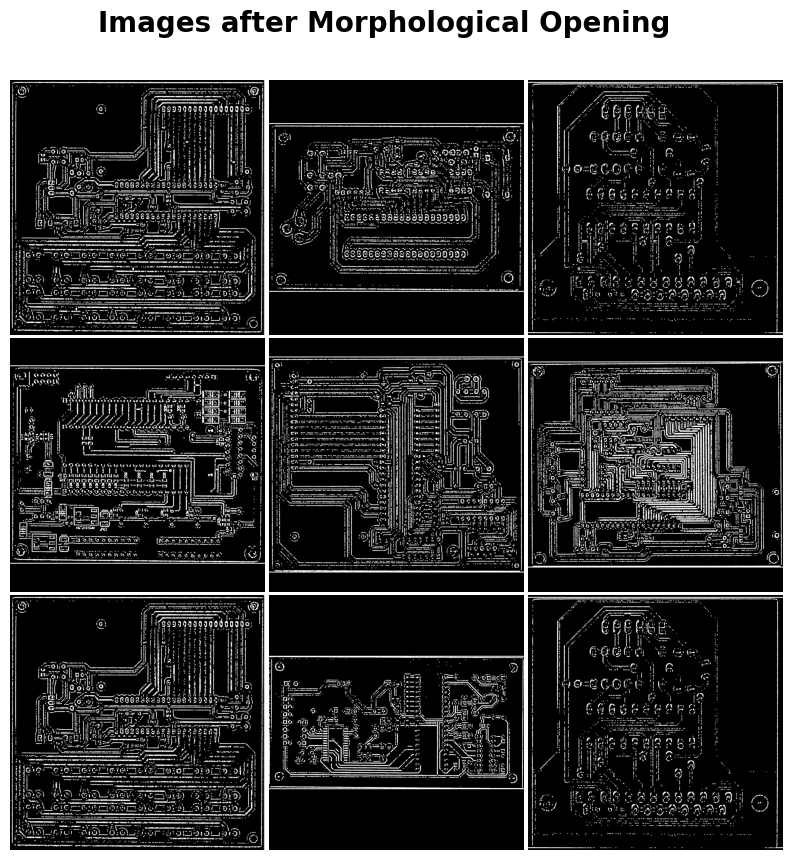

<Figure size 640x480 with 0 Axes>

In [ ]:
pcb_visualizer.plot_images(morphological_opening_dataset, 'Images after Morphological Opening')

### Discussion
Applying erosion followed to dilation after tresholding the images seems to cause structural loss, as the operation appears more blurrred and to have induced noise. The operation is not promising for beein a suitable image preprocessing step.

## Step 7.b: Morphological Closing Operation
### Implementation

In [ ]:

def morphological_closing(tf_image, tf_target):

    cv_img = tf_image.numpy().astype('uint8')

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    dilated_img = cv2.dilate(cv_img, kernel, iterations=1)
    eroded_img = cv2.erode(dilated_img, kernel, iterations=1)

    tf_dilated_img = tf.convert_to_tensor(dilated_img, dtype=tf.uint8)
    tf_dilated_img = tf.reshape(tf_dilated_img, [tf_dilated_img.shape[0], tf_dilated_img.shape[1], 1])

    return (tf_dilated_img, tf_target)

morphological_closing_dataset = adaptive_thresholded_dataset.map(
    lambda img, tgt: tf.py_function(func=morphological_closing, inp=[img, tgt], Tout=(tf.uint8, tf.int8))
)


### Processed Images

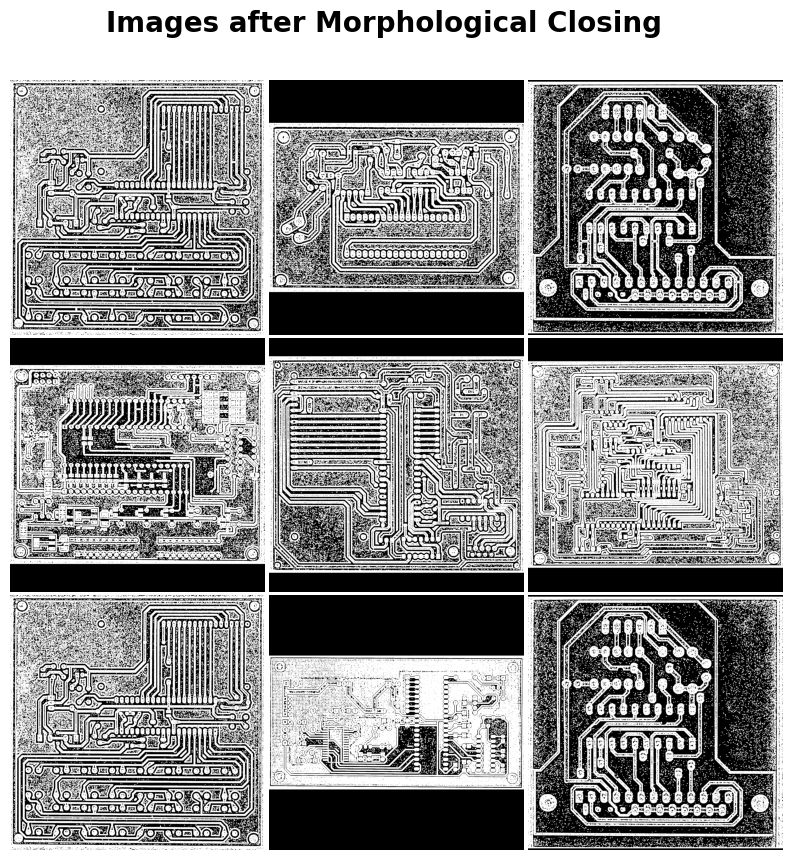

<Figure size 640x480 with 0 Axes>

In [ ]:
pcb_visualizer.plot_images(morphological_closing_dataset, 'Images after Morphological Closing')

### Discussion
Applying dilation followed to erosion seems to bring similar results als the opening operation. Both morphological operations are not promising for beein a suitable image preprocessing step.

## Step 8: Normalization
### Implementation

In [ ]:
def normalize_image(*tf_data):

    tf_image = tf_data[0]
    
    tf_float_image = tf.cast(tf_image, tf.float32)  
    
    tf_normalized_image = tf_float_image / 255.0

    return (tf_normalized_image, tf_data[1]) 

image_dataset_normalized = adaptive_thresholded_dataset.map(lambda img, tgt: tf.py_function(func=normalize_image, inp=[img, tgt], Tout=(tf.float32, tf.int8)))

## Step 9: Standardization
### Implementation

In [ ]:

def standardize_image(*tf_data):
    tf_image = tf_data[0]
    

    image_mean = tf.math.reduce_mean(tf_image)
    image_stddev = tf.math.reduce_std(tf_image)
    
    tf_standardized_image = (tf_image - image_mean) /(image_stddev + 1e-7)
    
    return (tf_standardized_image, tf_data[1])

image_dataset_normalized_no_th = grayscale_dataset.map(lambda img, tgt: tf.py_function(func=normalize_image, inp=[img, tgt], Tout=(tf.float32, tf.int8)))
image_dataset_standardized = image_dataset_normalized_no_th.map(lambda img, tgt: tf.py_function(func=standardize_image, inp=[img, tgt], Tout=(tf.float32, tf.int8)))


### Analysis

In [ ]:
def get_statistics(image_tf_dataset):

    images_mean_arr = []
    images_stddev_arr = []

    for image_data in image_tf_dataset:
        image = image_data[0].numpy()  
        images_mean_arr.append(np.mean(image))
        images_stddev_arr.append(np.std(image)) 
    
    images_mean = np.mean(images_mean_arr)
    images_stddev = np.mean(images_stddev_arr)

    return images_mean, images_stddev

images_mean, images_stddev = get_statistics(image_dataset_standardized)
print('Images Mean: ', images_mean)
print('Images Standard Deviation: ', images_stddev)


Images Mean:  -6.7124057e-07
Images Standard Deviation:  0.99999917


### Annotation
Standardizing the images will only appropriate for not tresholded Images.

## Additional Step: Edge Detection
### Implementation

In [ ]:
def edge_detection(tf_img, tf_target):
    
    cv_img = (tf_img.numpy()).astype('uint8')

    # Canny Edge Detection
    edges = cv2.Canny(cv_img, 100, 200)  # 100 and 200 are lower and upper thresholds
    
    tf_edge_image = tf.convert_to_tensor(edges, dtype=tf.uint8)

    tf_edge_image = tf.reshape(tf_edge_image, [tf_edge_image.shape[0], tf_edge_image.shape[1], 1])
    
    return (tf_edge_image, tf_target)

temp_dataset = image_dataset.map(lambda img, tgt: tf.py_function(func=to_grayscale, inp=[img, tgt], Tout=(tf.uint8, tf.int8)))
edge_detected_dataset_raw = temp_dataset.map(lambda img, tgt: tf.py_function(func=edge_detection, inp=[img, tgt], Tout=(tf.uint8, tf.int8)))
edge_detected_dataset_prc = grayscale_dataset.map(lambda img, tgt: tf.py_function(func=edge_detection, inp=[img, tgt], Tout=(tf.uint8, tf.int8)))
morphological_opening_dataset_raw = edge_detected_dataset_raw.map(lambda img, tgt: tf.py_function(func=morphological_closing, inp=[img, tgt], Tout=(tf.uint8, tf.int8)))
morphological_opening_dataset_prc = edge_detected_dataset_prc.map(lambda img, tgt: tf.py_function(func=morphological_closing, inp=[img, tgt], Tout=(tf.uint8, tf.int8)))

### Processed Images

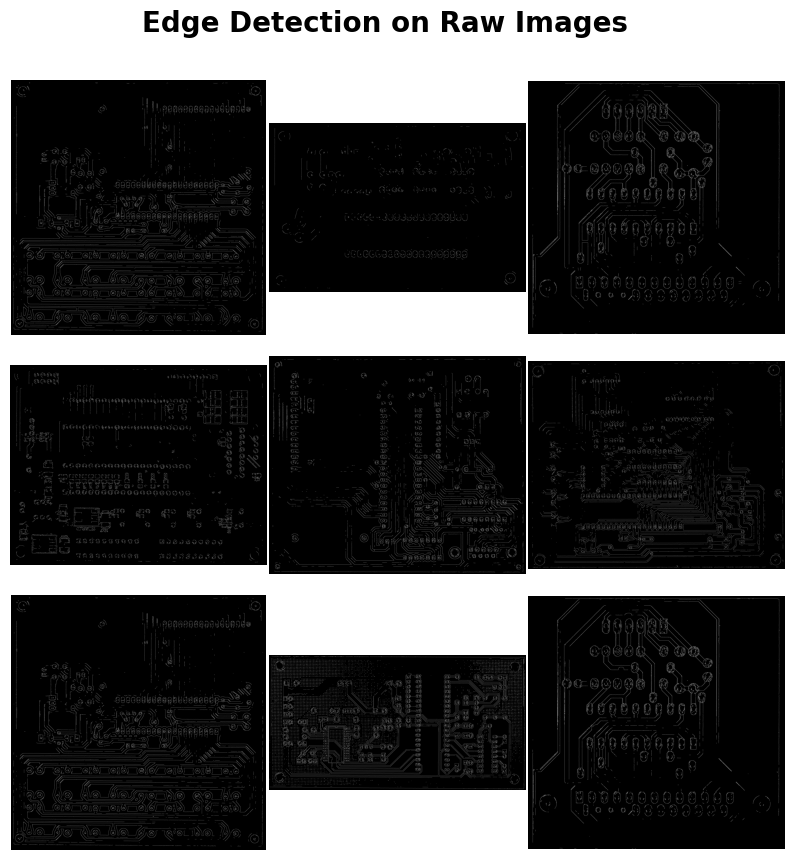

<Figure size 640x480 with 0 Axes>

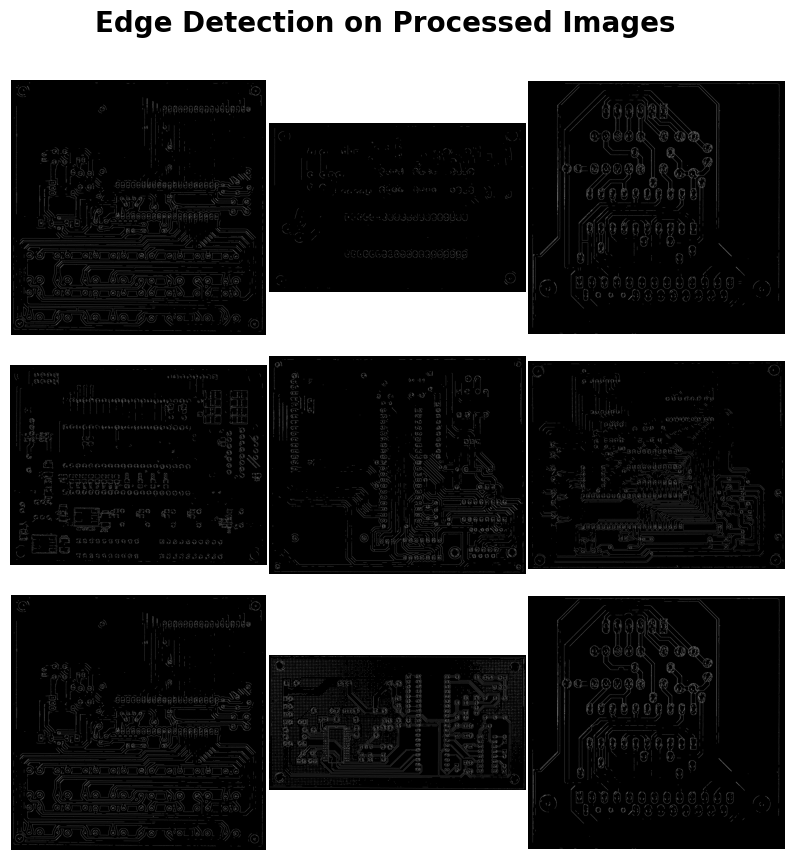

<Figure size 640x480 with 0 Axes>

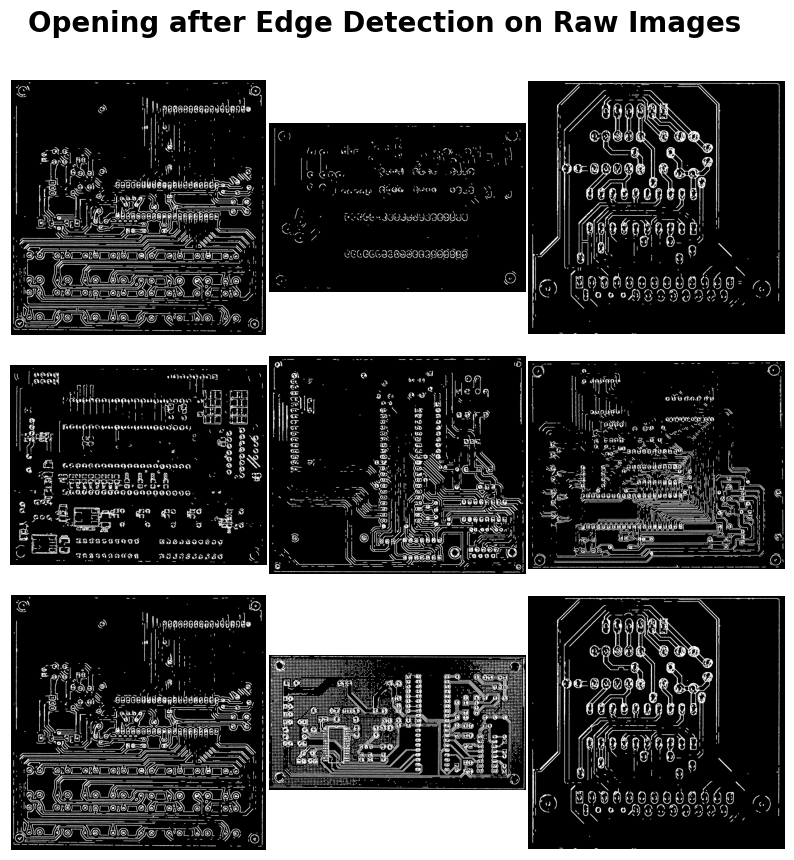

<Figure size 640x480 with 0 Axes>

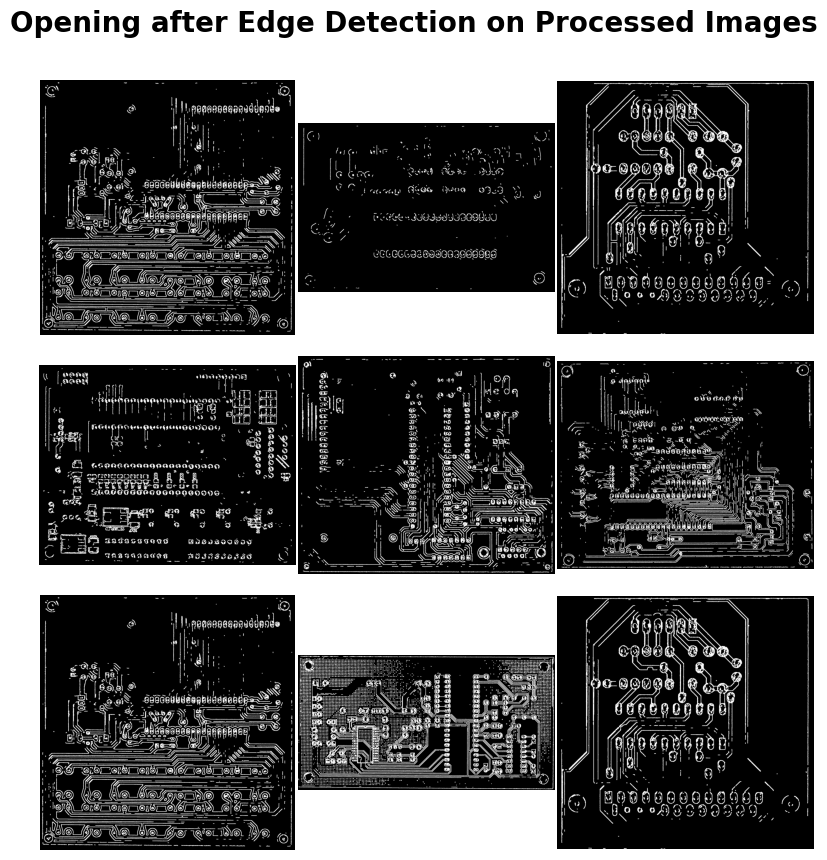

<Figure size 640x480 with 0 Axes>

In [ ]:
pcb_visualizer.plot_images(edge_detected_dataset_raw, 'Edge Detection on Raw Images')
pcb_visualizer.plot_images(edge_detected_dataset_prc, 'Edge Detection on Processed Images')
pcb_visualizer.plot_images(morphological_opening_dataset_raw, 'Opening after Edge Detection on Raw Images')
pcb_visualizer.plot_images(morphological_opening_dataset_prc, 'Opening after Edge Detection on Processed Images')

### Discussion
The images appear severly blurred. A significan part of layout information of the PCB has been lost. The accomplished step are not promising at all. 